# Campito Mountain Bristlecone Example

This notebook uses raw ring widths for bristlecone pine (_Pinus longaeva_) at Campito Mountain in California, USA. This is one of the datasets included in `dplR` as well and include in the dplPy distribution.

> Graybill, D. A. and LaMarche, Jr., V. C. (1983) Campito Mountain Data Set. IGBP PAGES/World Data Center for Paleoclimatology Data Contribution Series 1983-CA533.RWL. NOAA/NCDC Paleoclimatology Program, Boulder, Colorado, USA: https://www.ncei.noaa.gov/pub/data/paleo/treering/measurements/northamerica/usa/ca533.rwl

Let's start by importing some standard Python libraries.  We'll bring in Pandas (for working with 2 dimensional data), Matplotlib to help with plotting,  

In [1]:
import pandas as pd
import matplotlib.pyplot as plt 

# the following two lines nicely render figures in the notebook 
%config InlineBackend.figure_format = 'retina'
%matplotlib inline

# you can omit the line below if you'd like, but I really don't like the default fonts in Python, so I switch to Helvetica
plt.rcParams['font.family'] = 'Helvetica'
plt.rcParams['figure.figsize'] = (10, 5)


We can update (or install) `dplpy` directly from this notebook if necessary using the 'bang' (`!`) command - you can just skip this code block or comment it out if you're already running the latest version from the Pypi repository.


In [2]:
# if necessary, install dplpy
# !pip install dplpy

# if necessary upgrade dplpy to the latest version, the latest version
# !pip install dplpy --upgrade


Let us now import `dplpy` and we'll check the version number and see where the library is on our system.  If everything is working well, the codeblock should complete without error and you should see that you are running v0.1.2 from one of your Python directories (you will see `/envs/` in the path if you are in a virtual environment)

In [3]:
import dplpy as dpl

# print out the version number of dplPy you are using - should match the installed version 
print('Currently using the following version of dplPy:', dpl.__version__)

# You should see the path to your local Python installation
print('Currently using the following directory for dplPy:', dpl.__file__)

Currently using the following version of dplPy: 0.4.0
Currently using the following directory for dplPy: /home/claude/mainwork/src/dplpy/__init__.py


Let's read the Campito Mountain raw measurement series into our notebook now.  We will use the `dpl.readers` method to do this.  For the moment, `.readers` automatically identified the file type from the file suffix, looking for `.rwl` for Tucson formatted decadal files, or `.csv`.  In the future, the method will recognize a wider variety of suffixes (e.g. `.raw`), allow you to pass the file type directly to the method, or pull from the ITRDB.  

In [4]:
# Read in the Campito Mountain series and assign to a variable
ca533 = dpl.readers("../tests/data/rwl/ca533.rwl")

ca533.rwl successfully extracted as rwl file with 34 series covering the period from 626 to 1983


In [5]:
# take a look at the DataFrame
ca533 #1358 years by 34 columns

,CAM011,CAM021,CAM031,CAM032,CAM041,CAM042,CAM051,CAM061,CAM062,CAM071,...,CAM151,CAM152,CAM161,CAM162,CAM171,CAM172,CAM181,CAM191,CAM201,CAM211
Year,,,,,,,,,,,,,,,,,,,,,
626,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.17
627,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.13
628,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.14
629,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.19
630,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.22
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1979,0.40,0.42,0.33,0.61,0.75,0.50,0.25,0.42,0.58,0.11,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1980,0.45,0.59,0.77,0.67,1.09,0.65,0.36,0.69,0.71,0.14,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1981,0.48,0.57,0.69,0.55,0.76,0.56,0.32,0.64,0.51,0.27,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


We could also read in the Sheep Mountain update (`ca667.rwl`).  This file has headers, though - we tell `.readers` about the existence of the Tucson style (3 line) headers when we call `.readers`:

In [6]:
# Can specify whether file has headers so reading of data is done appropriately
ca667 = dpl.readers("../tests/data/rwl/ca667.rwl", header=True)
ca667 # 310 columns, 4655 years

ca667.rwl successfully extracted as rwl file with 310 series covering the period from -2649 to 2005 (auto-detected 3 header lines)
  1 series combined from non-overlapping duplicate IDs (merged segments):
    ST850A: 2 segments spanning -662 to 453


,SS004B,SL009A,ST860B,SS024B,SL004B,SG067A,SN151A,SL166B,SS004A,SL166C,...,SH970A,SH913B,SH965b,ST891A,ST891B,SL605B,SH965a,SH958A,ST814A,Sn974b
Year,,,,,,,,,,,,,,,,,,,,,
-2649,0.68,0.28,0.43,0.47,0.64,0.40,0.69,0.56,0.62,0.40,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
-2648,0.63,0.38,0.45,0.43,0.51,0.22,0.73,0.46,0.50,0.34,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
-2647,0.47,0.30,0.36,0.16,0.33,0.16,0.43,0.36,0.36,0.25,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
-2646,0.62,0.33,0.45,0.31,0.68,0.29,0.61,0.46,0.67,0.33,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
-2645,0.51,0.44,0.42,0.21,0.55,0.21,0.45,0.53,0.67,0.36,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2001,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,1.512,0.952,0.432,0.55,0.66,NaN,NaN,0.538,0.70,1.960
2002,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,1.226,0.628,0.070,0.67,0.55,NaN,NaN,0.256,0.60,1.088
2003,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,1.758,0.728,0.126,0.75,0.73,NaN,NaN,0.402,0.73,1.194


In [7]:
print(ca533.index) # Campito Mountain chronology covers 626 to 1983
print(ca667.index)  # Campito Mountain chronology covers -2649 (BCE) to 2005!

Index([ 626,  627,  628,  629,  630,  631,  632,  633,  634,  635,
       ...
       1974, 1975, 1976, 1977, 1978, 1979, 1980, 1981, 1982, 1983],
      dtype='int64', name='Year', length=1358)
Index([-2649, -2648, -2647, -2646, -2645, -2644, -2643, -2642, -2641, -2640,
       ...
        1996,  1997,  1998,  1999,  2000,  2001,  2002,  2003,  2004,  2005],
      dtype='int64', name='Year', length=4655)


We could, if we wanted, use Pandas to merge the two datasets to form a combined Sheep-Campito Mountain chronology.  The codeblock below shows how to use Pandas [.merge](https://pandas.pydata.org/docs/reference/api/pandas.DataFrame.merge.html) to do this.  Because this creates a very large and very long set of series, we won't use this in the rest of the notebook, but it is useful to see how you might do this.  Of note is that the `.merge` function is NOT unique to `dplpy` - following the overall philosophy also adopted for dplR, we don't create functions with openDendro to do common data manipulations or data handling (e.g. things that are not specific to dendrochronology): 

In [8]:
shpcmp = pd.merge(ca533, ca667, left_index=True, right_index=True, how='outer')
shpcmp # pretty-print from Pandas will show 4655 years x 344 columns

,CAM011,CAM021,CAM031,CAM032,CAM041,CAM042,CAM051,CAM061,CAM062,CAM071,...,SH970A,SH913B,SH965b,ST891A,ST891B,SL605B,SH965a,SH958A,ST814A,Sn974b
Year,,,,,,,,,,,,,,,,,,,,,
-2649,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
-2648,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
-2647,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
-2646,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
-2645,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2001,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,1.512,0.952,0.432,0.55,0.66,NaN,NaN,0.538,0.70,1.960
2002,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,1.226,0.628,0.070,0.67,0.55,NaN,NaN,0.256,0.60,1.088
2003,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,1.758,0.728,0.126,0.75,0.73,NaN,NaN,0.402,0.73,1.194


Back to Campito Mountain (`ca533`)now.  Our `dplpy` provides both `.summary` statistics (the individual series mean, quantiles, max and min values) as well as the `.statistics` of the individual series including first and last year, mean, median, standard deviation, skew, gini coefficient and AR1 coefficient similar to ARSTAN.  The module names follow those in `dplR` and report complementary data:

In [9]:
dpl.summary(ca533)

,CAM011,CAM021,CAM031,CAM032,CAM041,CAM042,CAM051,CAM061,CAM062,CAM071,...,CAM151,CAM152,CAM161,CAM162,CAM171,CAM172,CAM181,CAM191,CAM201,CAM211
count,454.000000,551.000000,628.000000,549.000000,301.000000,446.000000,737.000000,627.000000,459.000000,947.000000,...,749.000000,229.000000,504.000000,1000.000000,758.000000,797.000000,781.000000,791.000000,593.000000,1343.000000
mean,0.439581,0.424465,0.349156,0.293224,0.525648,0.439148,0.273012,0.462281,0.441939,0.249071,...,0.445648,0.533799,0.339464,0.396710,0.450264,0.482296,0.282638,0.366271,0.473929,0.356813
std,0.221801,0.185397,0.213666,0.162930,0.222568,0.347705,0.139691,0.201785,0.188389,0.109357,...,0.272561,0.194947,0.148916,0.184057,0.209848,0.249002,0.148853,0.335788,0.180967,0.182086
min,0.000000,0.050000,0.000000,0.000000,0.100000,0.070000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.060000,0.000000,0.000000,0.080000,0.080000,0.000000,0.000000,0.000000,0.000000
25%,0.290000,0.290000,0.180000,0.180000,0.350000,0.270000,0.180000,0.335000,0.330000,0.180000,...,0.240000,0.410000,0.230000,0.260000,0.300000,0.310000,0.170000,0.170000,0.350000,0.220000
50%,0.400000,0.400000,0.290000,0.260000,0.530000,0.360000,0.250000,0.470000,0.450000,0.250000,...,0.390000,0.520000,0.330000,0.370000,0.400000,0.420000,0.250000,0.250000,0.470000,0.340000
75%,0.540000,0.520000,0.510000,0.390000,0.680000,0.460000,0.330000,0.600000,0.580000,0.320000,...,0.610000,0.660000,0.430000,0.510000,0.580000,0.590000,0.380000,0.455000,0.580000,0.470000
max,1.360000,1.110000,1.030000,0.850000,1.380000,3.030000,1.320000,1.090000,0.920000,0.620000,...,1.640000,1.250000,0.900000,1.040000,1.540000,1.980000,0.800000,2.540000,1.490000,1.100000


In [10]:
dpl.stats(ca533)

,series,first,last,year,mean,median,stdev,skew,kurtosis,gini,ar1
1,CAM011,1530,1983,454,0.440,0.40,0.222,1.029,1.102,0.273,0.696
2,CAM021,1433,1983,551,0.424,0.40,0.185,0.946,1.110,0.237,0.701
3,CAM031,1356,1983,628,0.349,0.29,0.214,0.690,-0.366,0.341,0.808
4,CAM032,1435,1983,549,0.293,0.26,0.163,0.717,0.159,0.309,0.661
5,CAM041,1683,1983,301,0.526,0.53,0.223,0.488,0.098,0.238,0.690
6,CAM042,1538,1983,446,0.439,0.36,0.348,3.678,17.713,0.324,0.880
7,CAM051,1247,1983,737,0.273,0.25,0.140,1.836,6.678,0.262,0.705
8,CAM061,1357,1983,627,0.462,0.47,0.202,-0.111,-0.223,0.247,0.509
9,CAM062,1525,1983,459,0.442,0.45,0.188,-0.266,-0.196,0.240,0.529
10,CAM071,1037,1983,947,0.249,0.25,0.109,0.027,0.022,0.247,0.577


Another module available is the `.report`, which has information similar to that provided by COFECHA and mirrors the similar function in dplR, including the years with locally absent rings in each individual series:

In [11]:
# We can get a report of some of the essential features of this dataset from .report
dpl.report(ca533)

Number of dated series: 34
Number of measurements: 23276
Avg series length: 684.5882
Range: 1358
Span: 626 - 1983
Mean (Std dev) series intercorrelation: 0.629 (0.086)
Mean (Std dev) AR1: 0.7093 (0.0981)
-------------
Years with absent rings listed by series

      CAM011 -- 1753 1782
      CAM031 -- 1497 1500 1523 1533 1540 1542 1545 1578 1579 1580 1655 1668 1670 1681
      CAM032 -- 1497 1523 1579 1654 1670 1681 1782
      CAM051 -- 1475
      CAM061 -- 1497 1523 1542 1545 1547 1579 1654 1655 1668 1670 1672 1782 1858 1960
      CAM062 -- 1542 1545 1547 1548 1579 1654 1655 1670 1672 1782 1836 1857 1858 1929
      CAM071 -- 1269 1497 1498 1523 1542 1547 1578 1579 1612 1655 1656 1668 1670 1672 1674 1690 1707 1708 1756 1782 1795 1820 1836 1845 1857 1858 1924 1948 1960
      CAM072 -- 1218 1497 1498 1523 1533 1538 1542 1545 1546 1547 1571 1579 1580 1590 1654 1655 1668 1670 1672 1675 1690
      CAM081 -- 1218 1336
      CAM082 -- 1362 1858 1865
      CAM091 -- 1655 1669 1670 1782 1858
    

As in dplR, we can readily `.plot` spaghetti (`type="spag"`) or segment (`type="seg"`) plots.  Note that `.plot` here is a method attached to the core `dplpy` library.  

findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


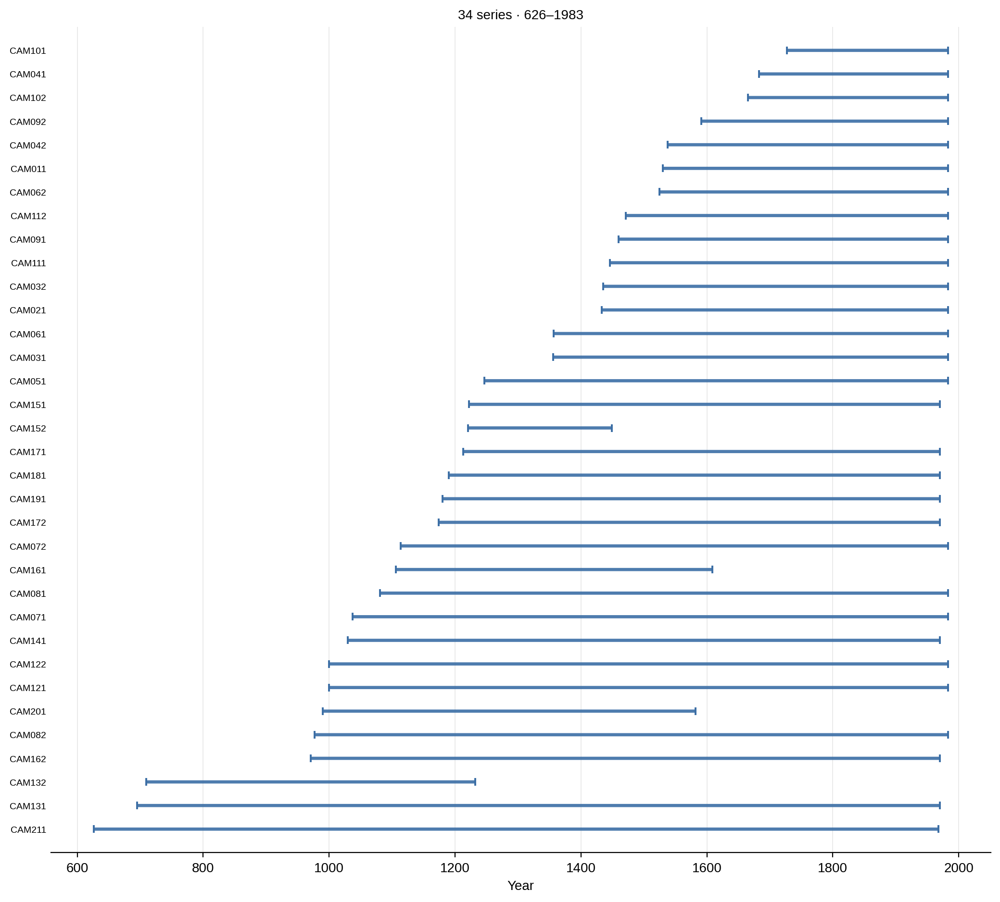

findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


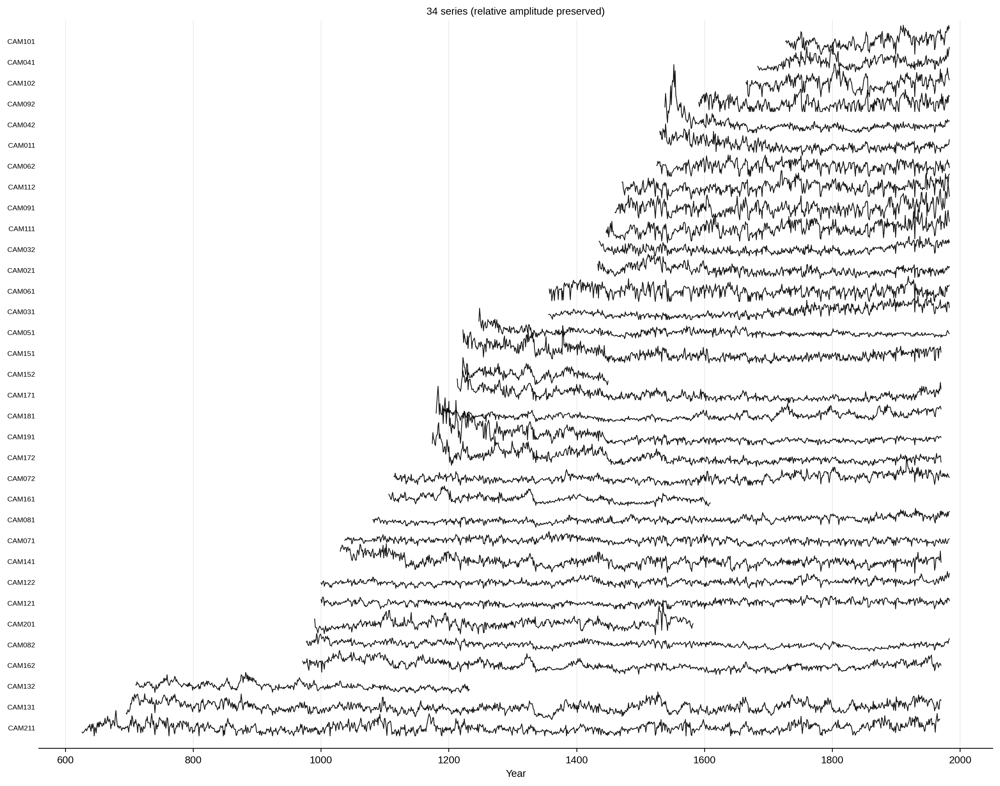

(<Figure size 1378.5x1088 with 1 Axes>,
 <Axes: title={'center': '34 series (relative amplitude preserved)'}, xlabel='Year'>)

In [12]:
dpl.plot(ca533, type="seg")
dpl.plot(ca533, type="spag")

Of course, detrending is one of the most important functions of DPL.  

findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


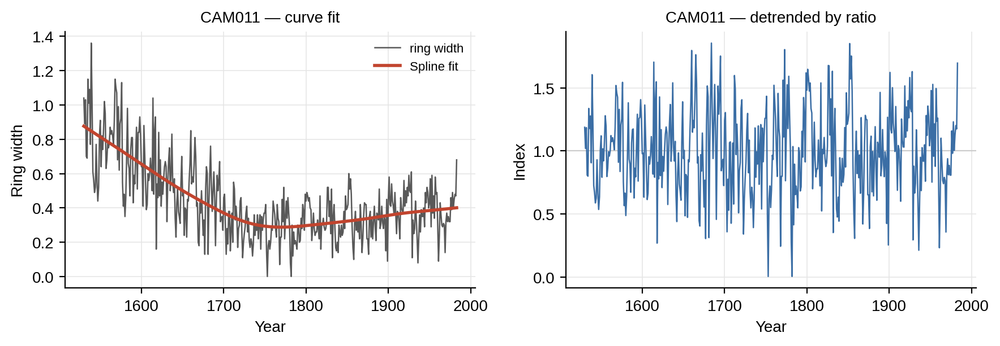

findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


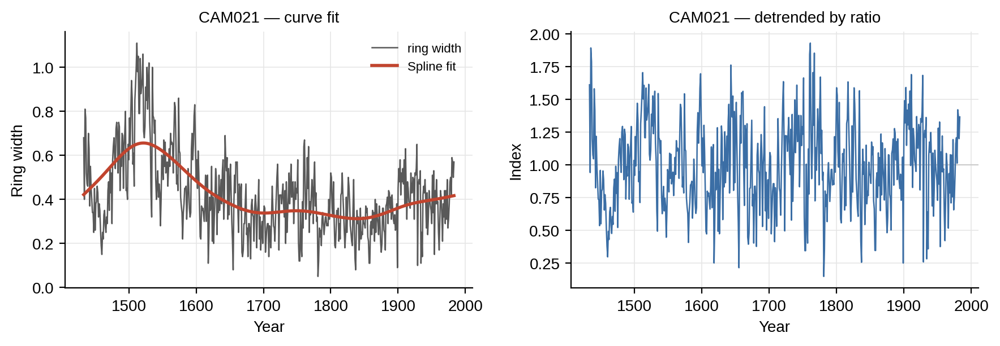

findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


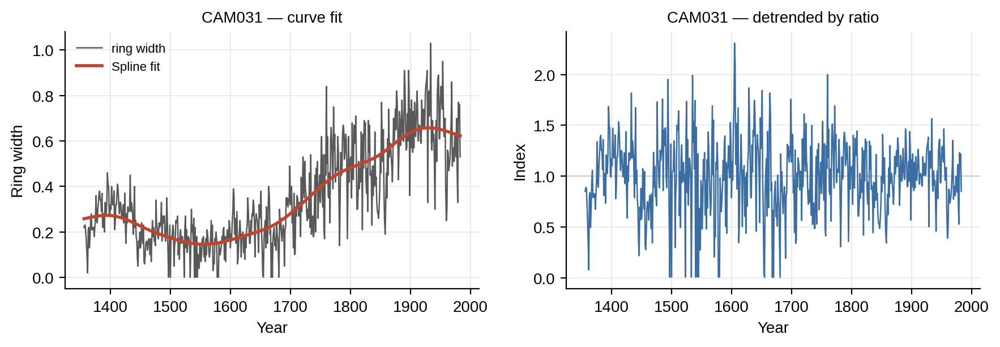

findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


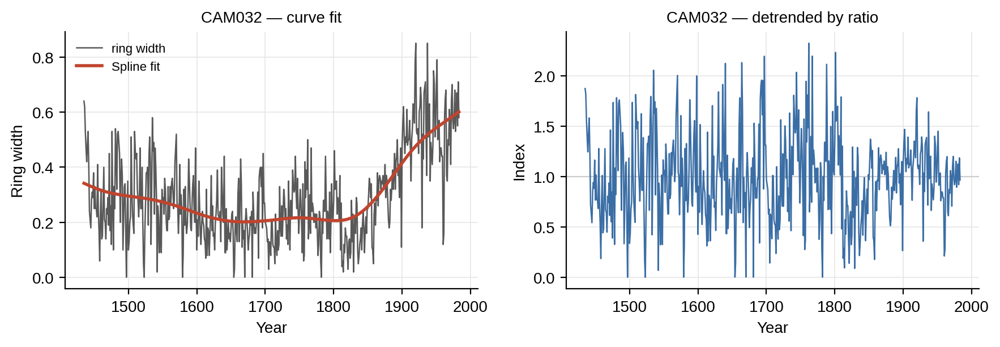

findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


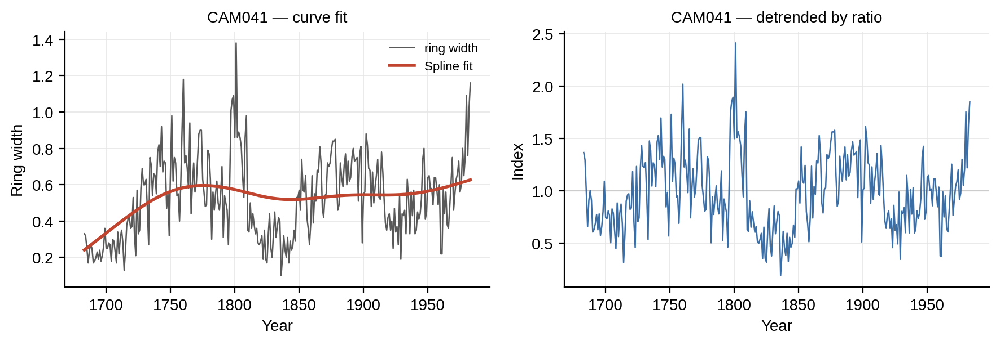

findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


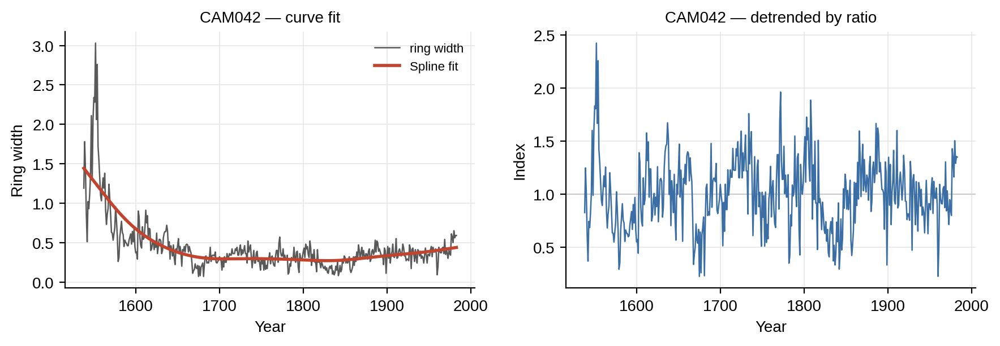

findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


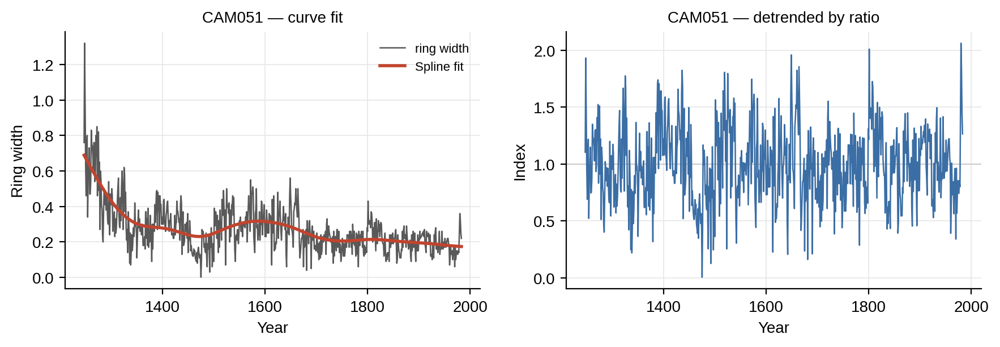

findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


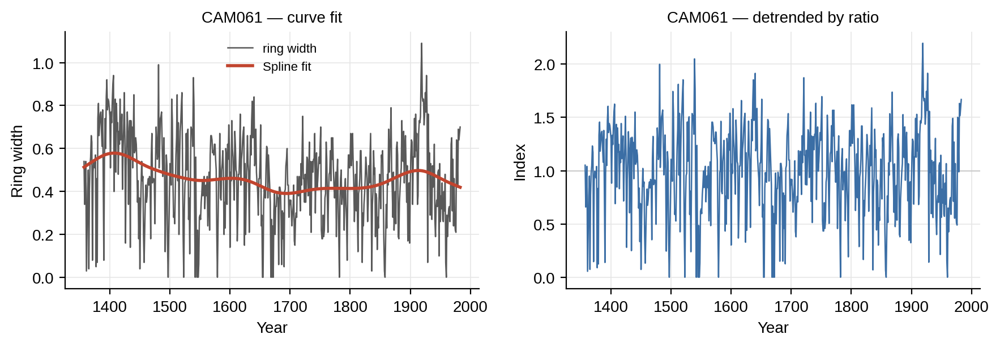

findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


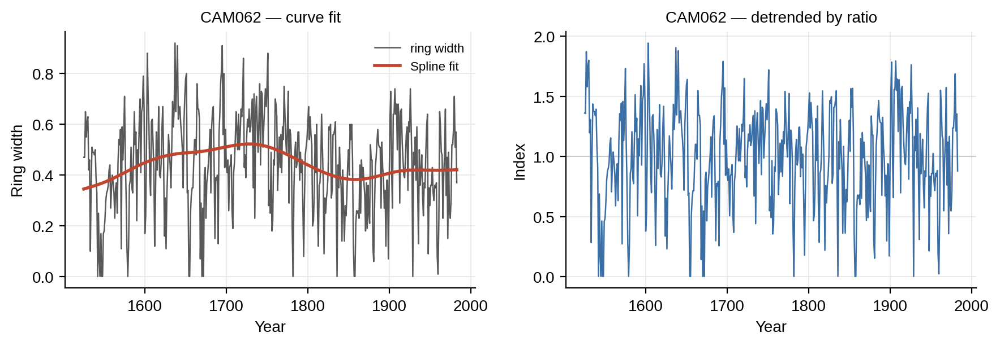

findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


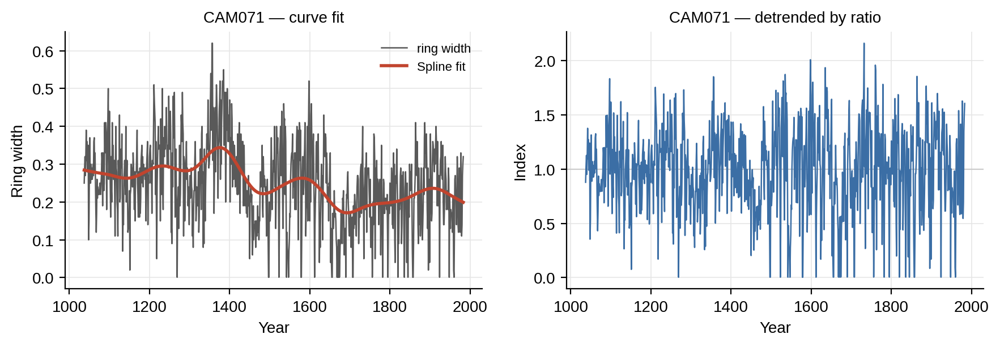

findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


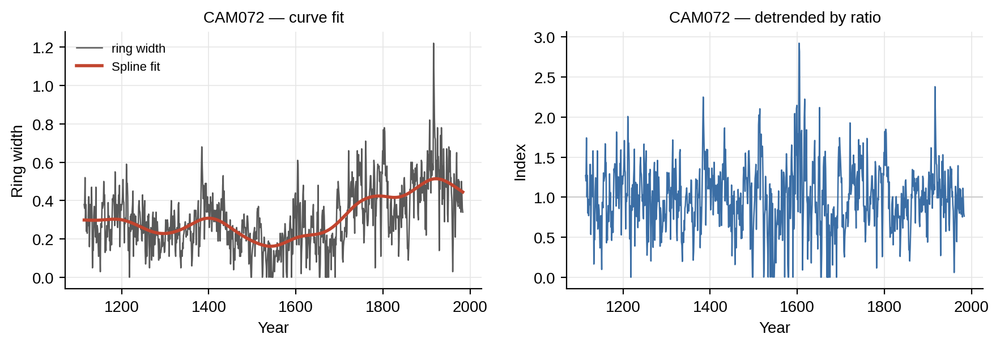

findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


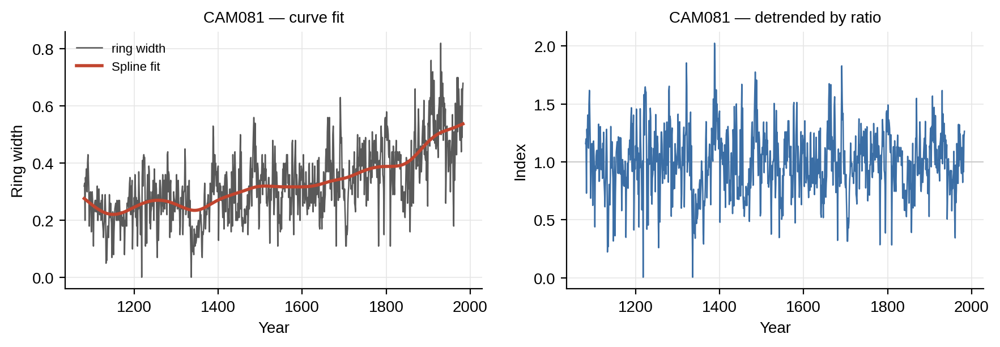

findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


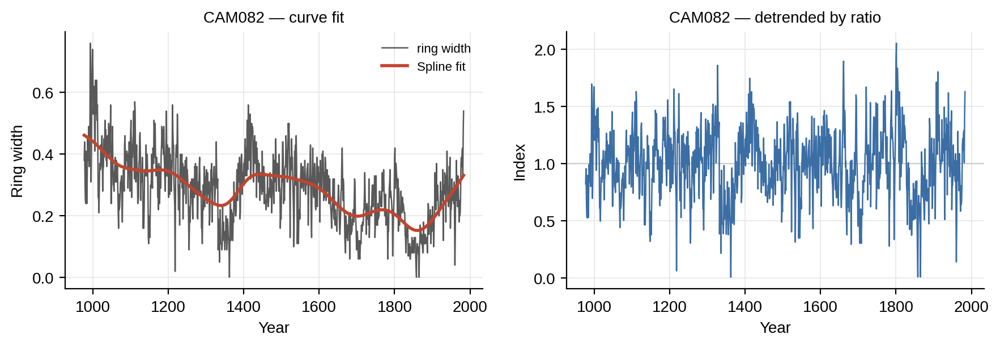

findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


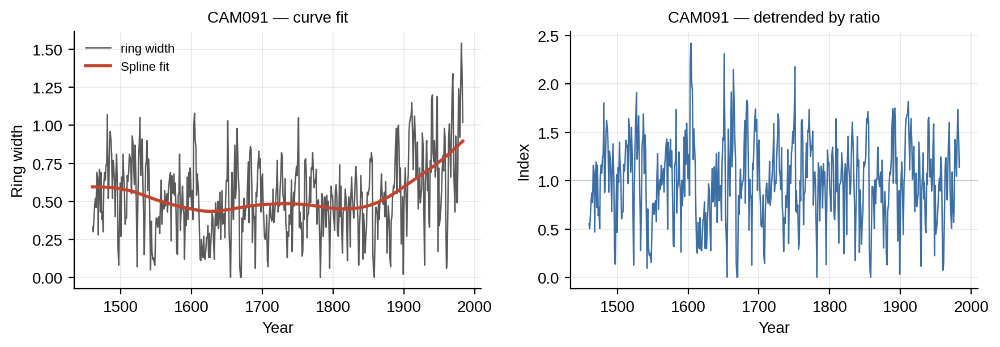

findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


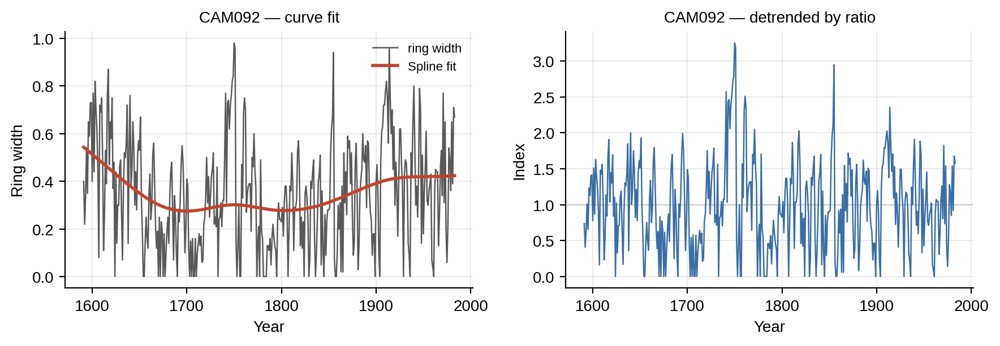

findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


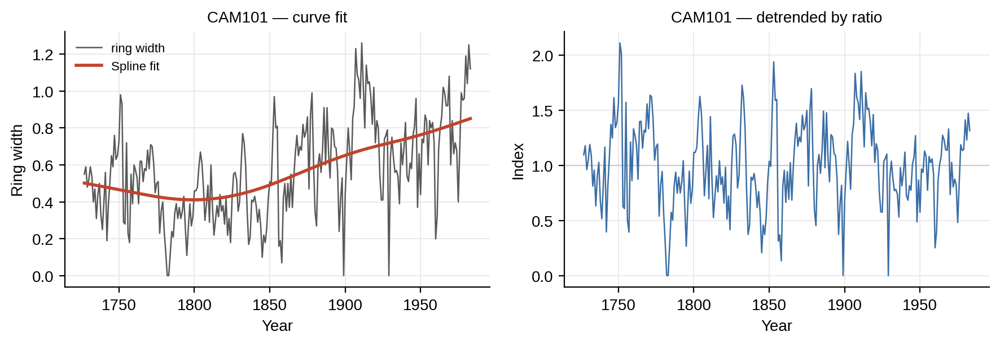

findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


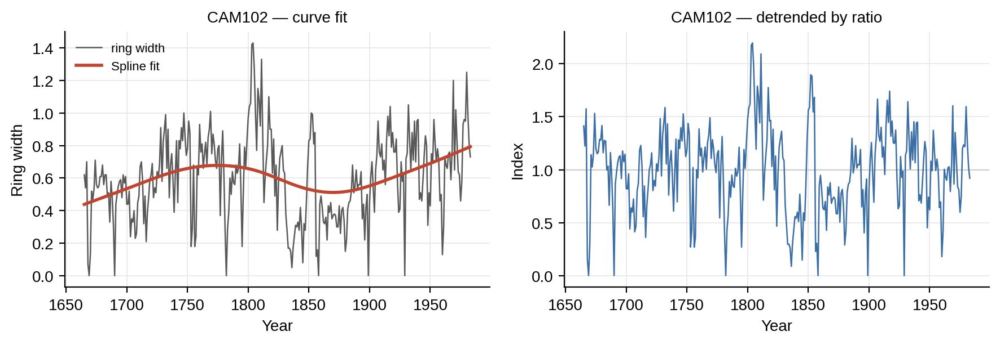

findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


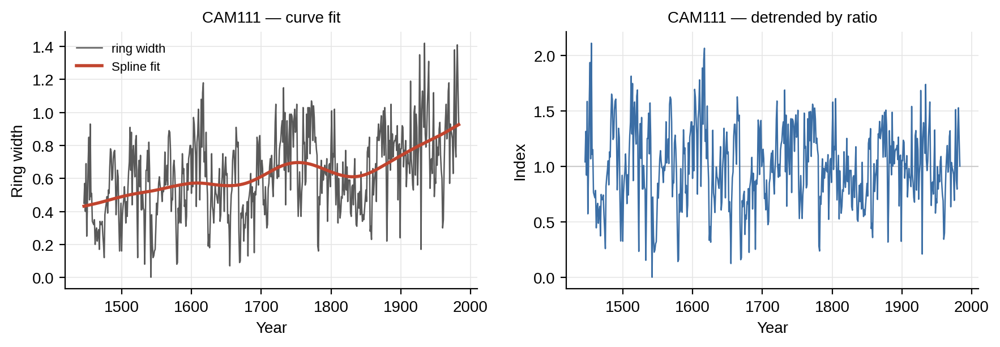

findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


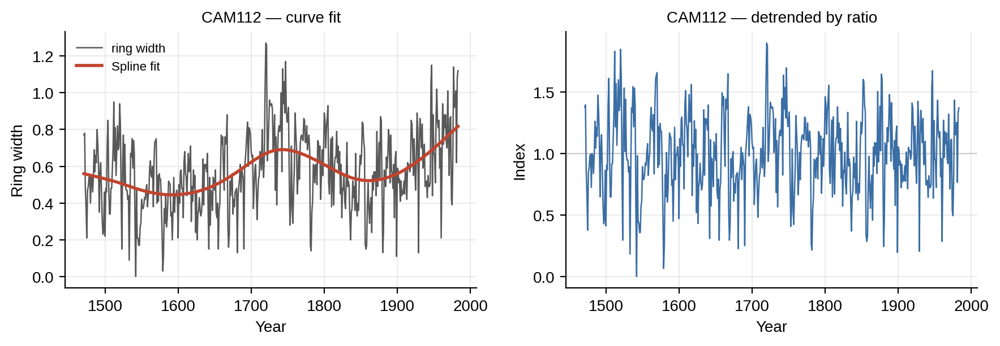

findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


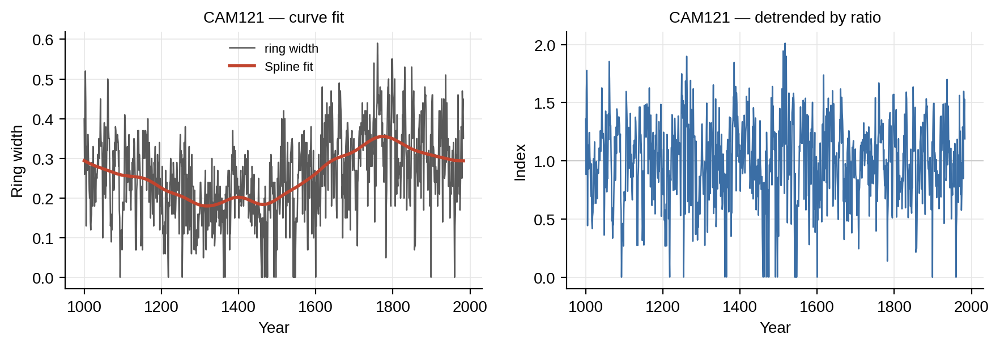

findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


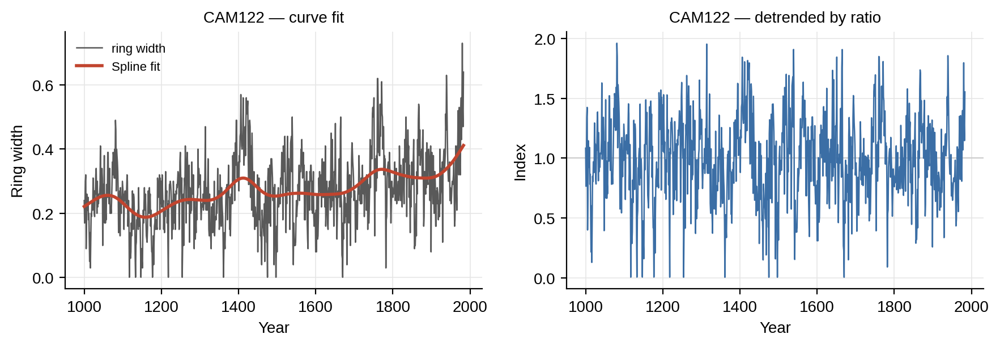

findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


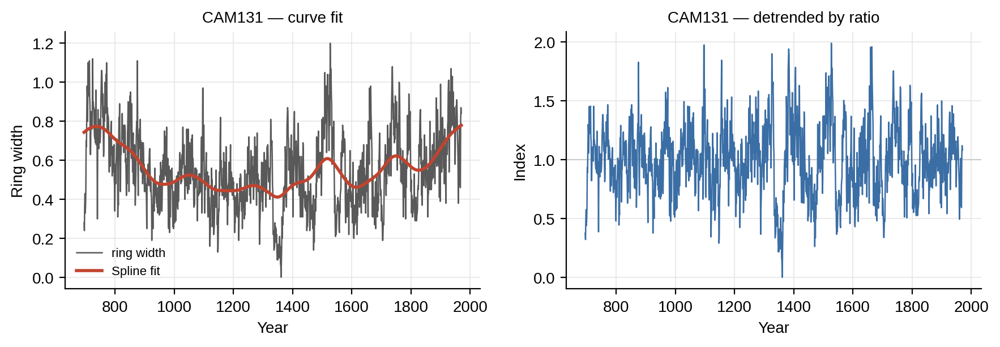

findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


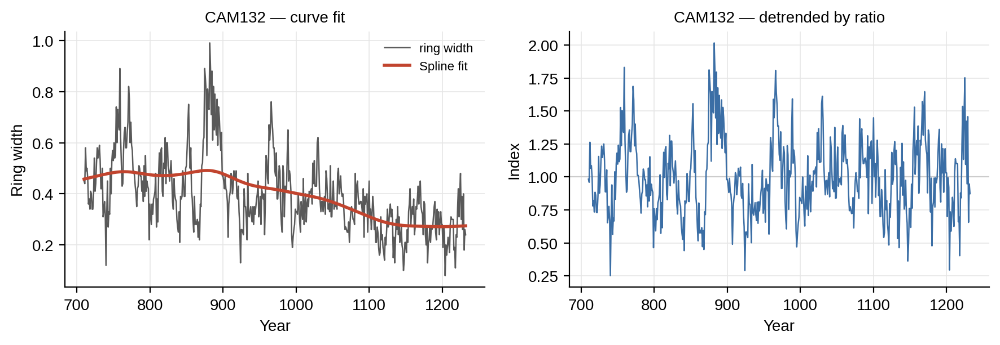

findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


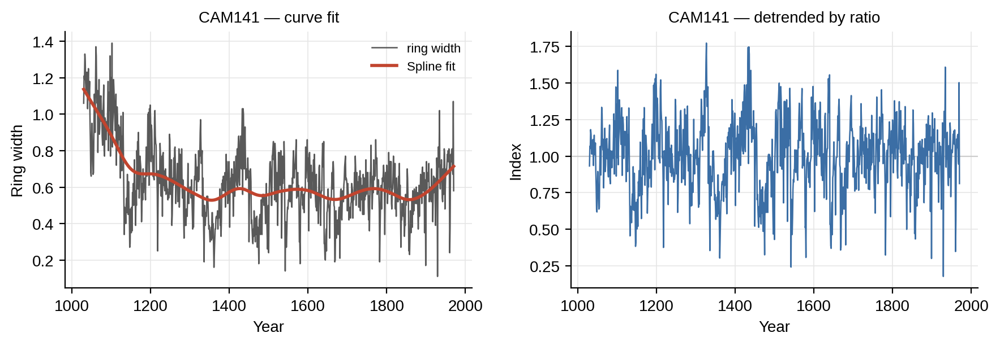

findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


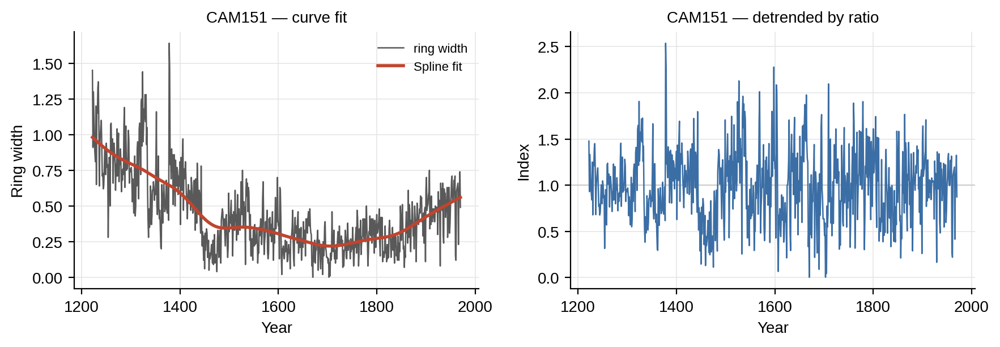

findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


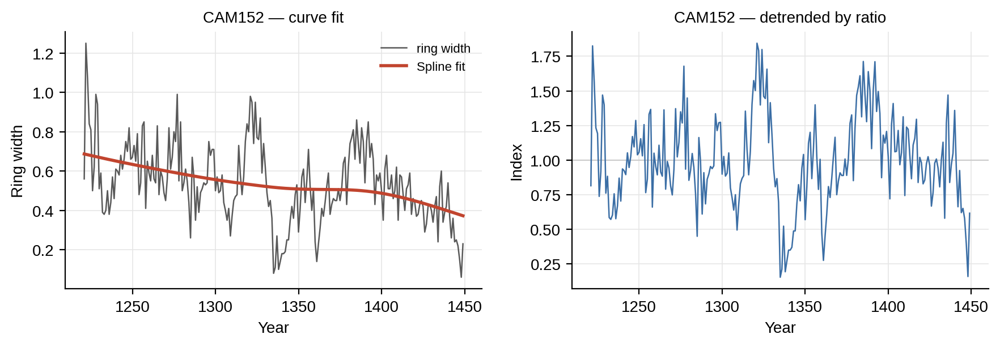

findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


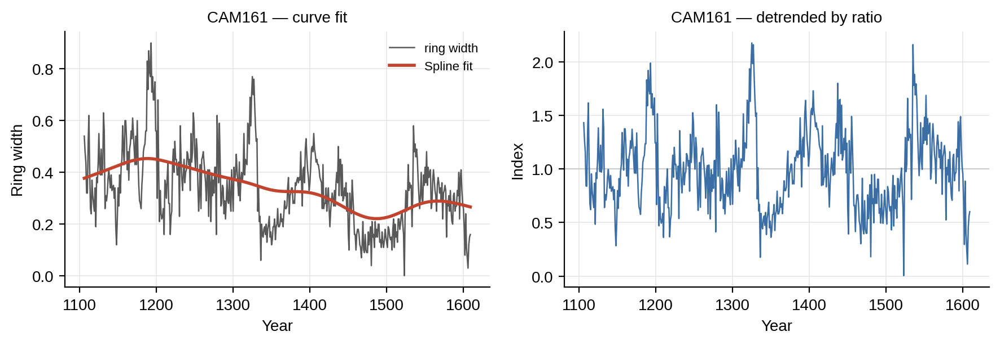

findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


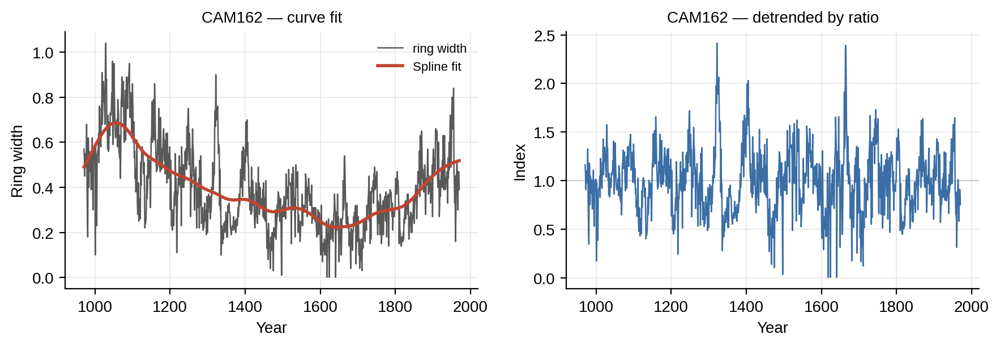

findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


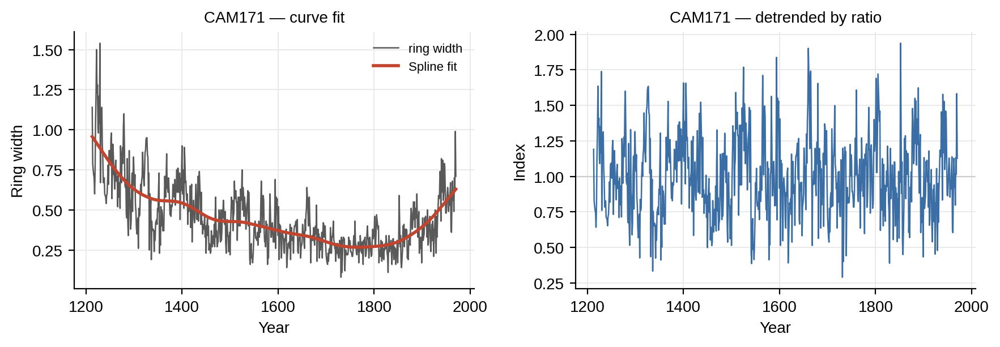

findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


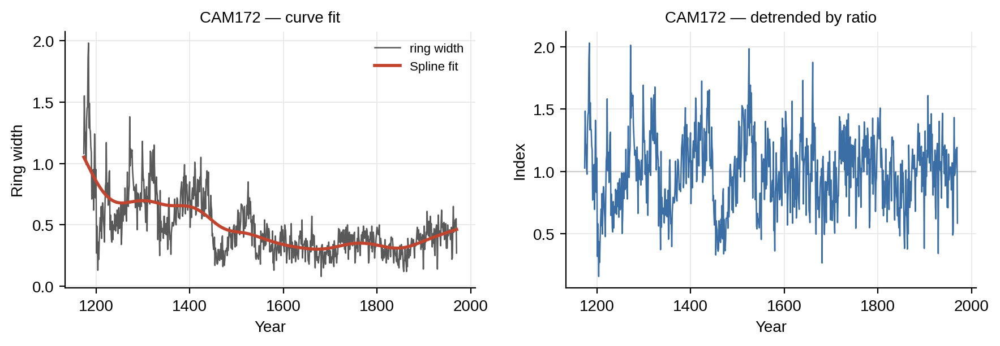

findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


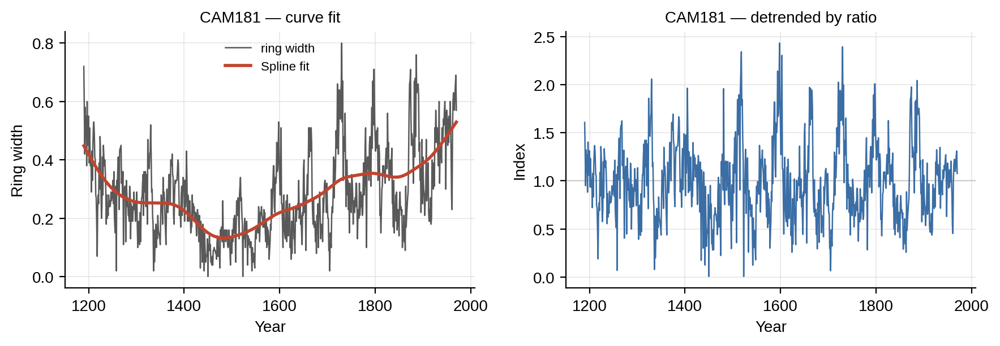

findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


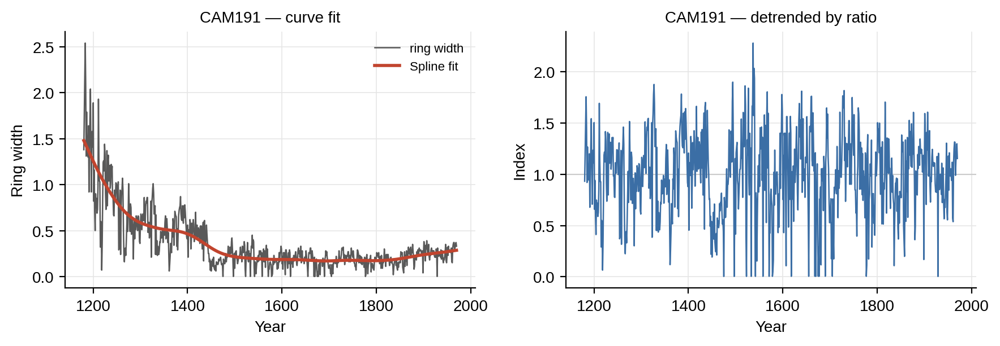

findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


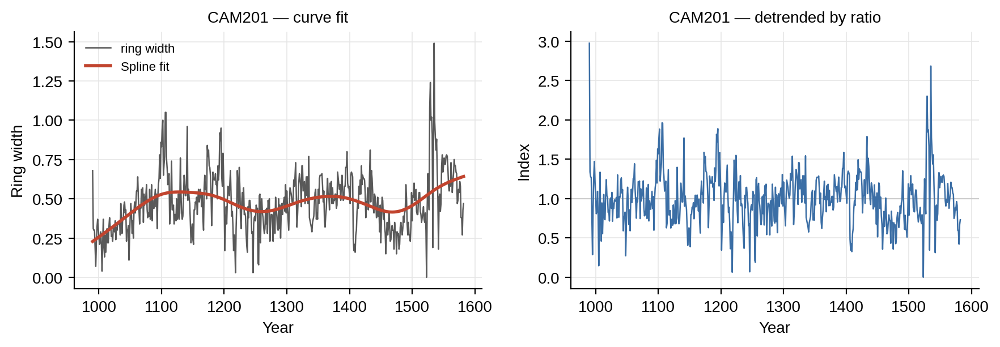

findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


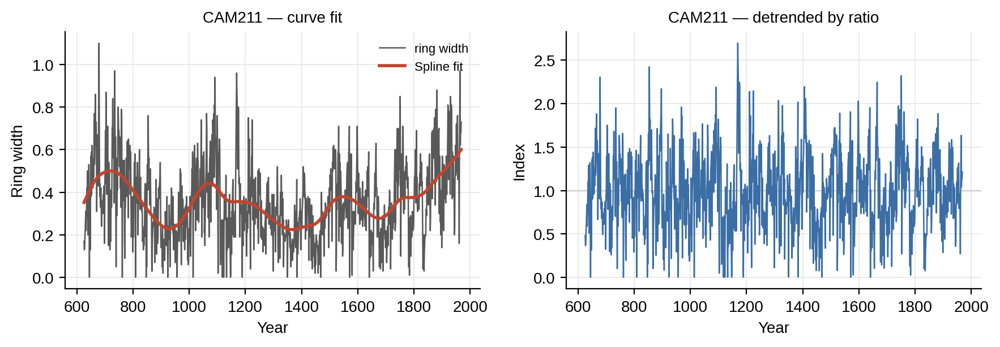

In [13]:
ca533_rwi = dpl.detrend(ca533, fit="Spline", period=200, method="ratio", plot=True)

findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


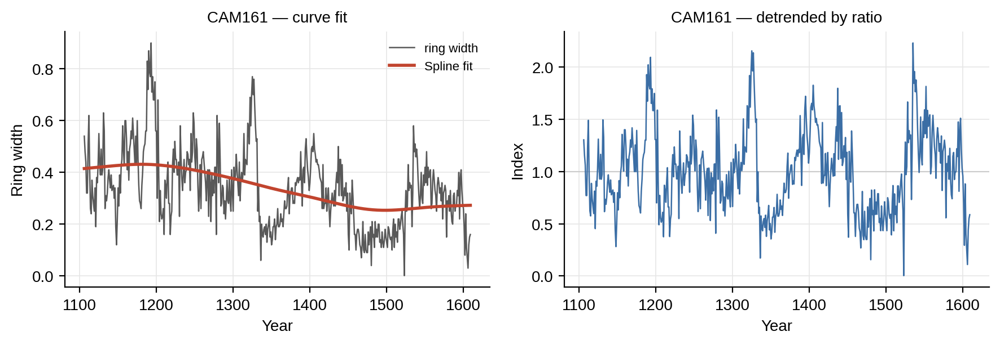

findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


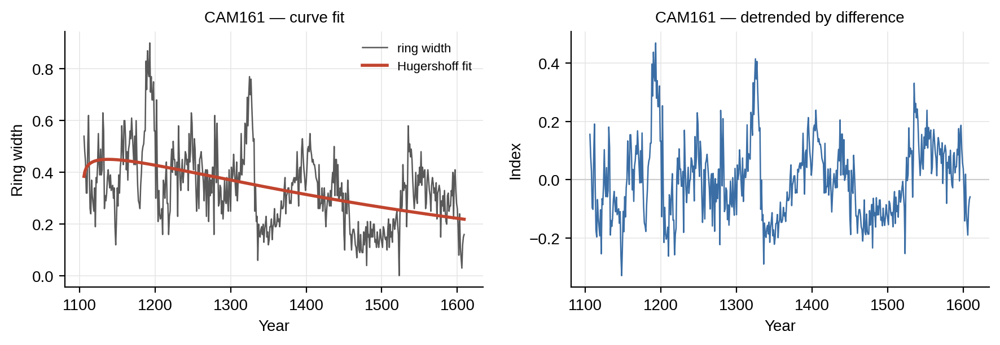

In [14]:
cam161_spline67 = dpl.detrend(ca533["CAM161"], fit="Spline", period=-67,method="ratio", plot=True)
cam161_negex = dpl.detrend(ca533["CAM161"], fit="Hugershoff", method="difference", plot=True)

findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


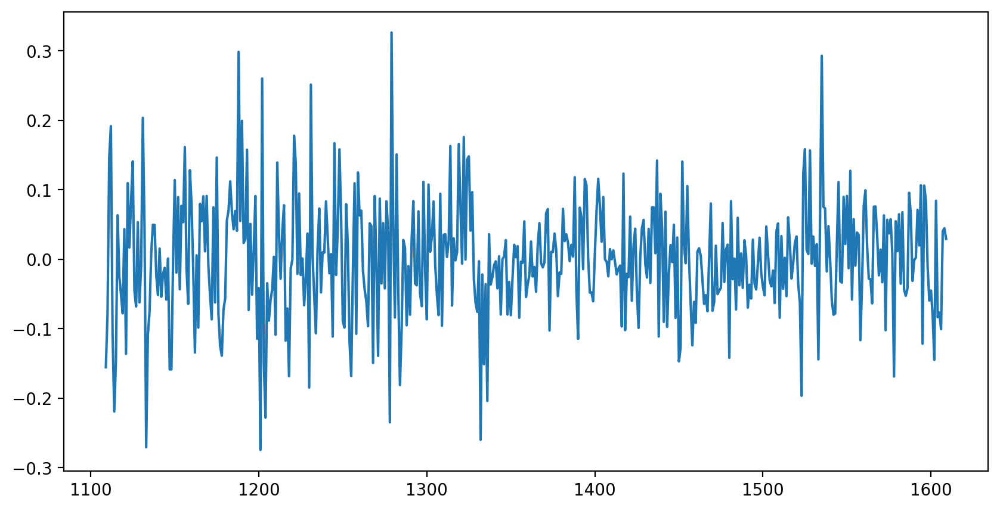

In [15]:
cam161_negex_res = dpl.ar_func(cam161_negex)
plt.plot(cam161_negex_res)

findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


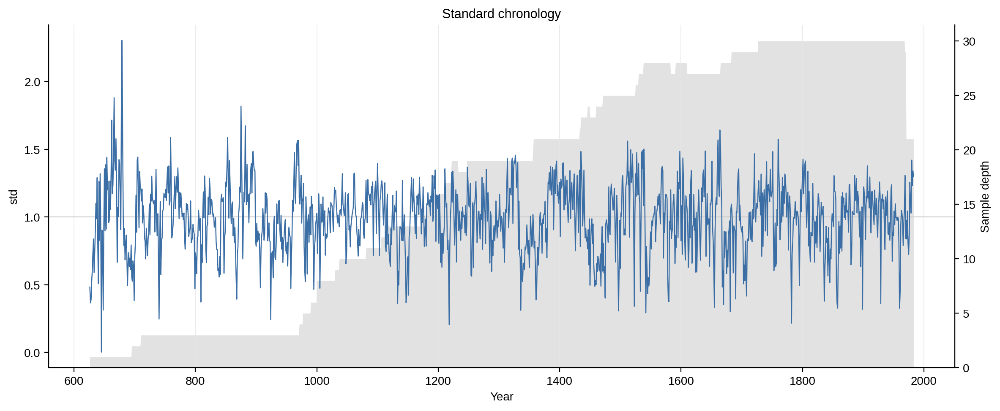

findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


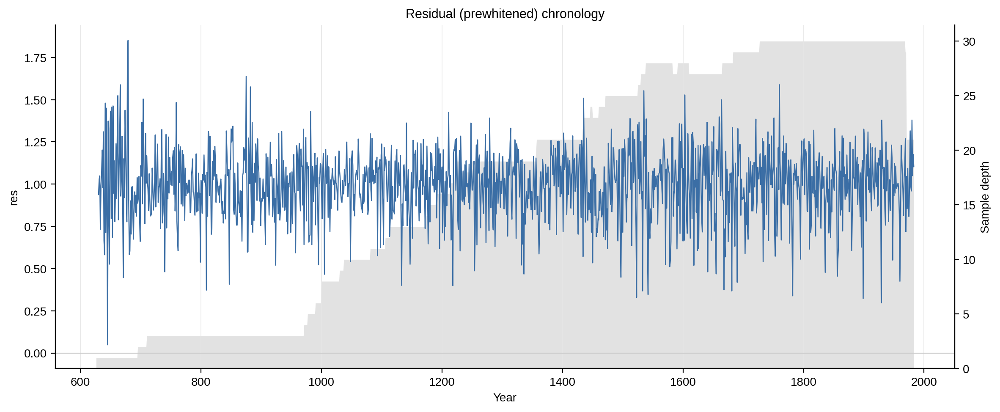

In [16]:
ca533_crn_std = dpl.chron(ca533_rwi, biweight=True, prewhiten=False, plot=True)
ca533_crn_res = dpl.chron(ca533_rwi, biweight=True, prewhiten=True, plot=True)

## Crossdating Functions

In [17]:
dpl.xdate(ca533_rwi, prewhiten=True, corr="Spearman", slide_period=50, bin_floor=10, p_val=0.05, show_flags=True)

Flags for CAM011
  [A] not significant: 1905-1954, 1930-1979
  [B] better at a lag:
      Segment       High  -10   -9   -8   -7   -6   -5   -4   -3   -2   -1    0   +1   +2   +3   +4   +5   +6   +7   +8   +9  +10
         1905-1954   +8 -0.12  0.12 -0.25  0.21  0.25 -0.05  0.17  0.15  0.01 -0.18  0.18  0.14 -0.03 -0.17 -0.01 -0.19  0.14 -0.20  0.29 -0.34 -0.05
         1930-1979   -6  0.02  0.12 -0.25 -0.04  0.31  0.18  0.15 -0.21 -0.14 -0.14  0.17  0.06  0.04 -0.02  0.09                                    

Flags for CAM051
  [A] not significant: 1380-1429
  [B] better at a lag:
      Segment       High  -10   -9   -8   -7   -6   -5   -4   -3   -2   -1    0   +1   +2   +3   +4   +5   +6   +7   +8   +9  +10
         1380-1429   +8 -0.17  0.30 -0.18  0.04 -0.05 -0.09 -0.11  0.25 -0.16  0.06  0.13 -0.04 -0.19  0.09  0.19  0.06 -0.06  0.17  0.31 -0.16 -0.11

Flags for CAM131
  [A] not significant: 1805-1854

Flags for CAM181
  [A] not significant: 1780-1829
  [B] better at a lag:
      S

{'seg_corr':         630-679  655-704  680-729   705-754   730-779   755-804   780-829  \
 CAM011      NaN      NaN      NaN       NaN       NaN       NaN       NaN   
 CAM021      NaN      NaN      NaN       NaN       NaN       NaN       NaN   
 CAM031      NaN      NaN      NaN       NaN       NaN       NaN       NaN   
 CAM032      NaN      NaN      NaN       NaN       NaN       NaN       NaN   
 CAM041      NaN      NaN      NaN       NaN       NaN       NaN       NaN   
 CAM042      NaN      NaN      NaN       NaN       NaN       NaN       NaN   
 CAM051      NaN      NaN      NaN       NaN       NaN       NaN       NaN   
 CAM061      NaN      NaN      NaN       NaN       NaN       NaN       NaN   
 CAM062      NaN      NaN      NaN       NaN       NaN       NaN       NaN   
 CAM071      NaN      NaN      NaN       NaN       NaN       NaN       NaN   
 CAM072      NaN      NaN      NaN       NaN       NaN       NaN       NaN   
 CAM081      NaN      NaN      NaN       NaN       N

findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


NB: with series_x=True, positive lags indicate missing rings in the series


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


findfont: Font family 'Helvetica' not found.


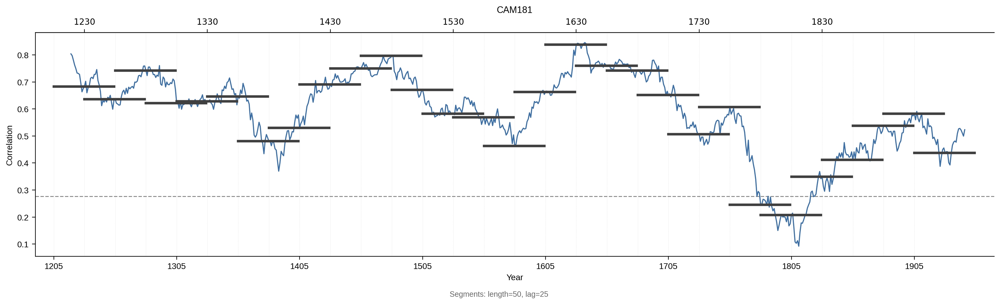

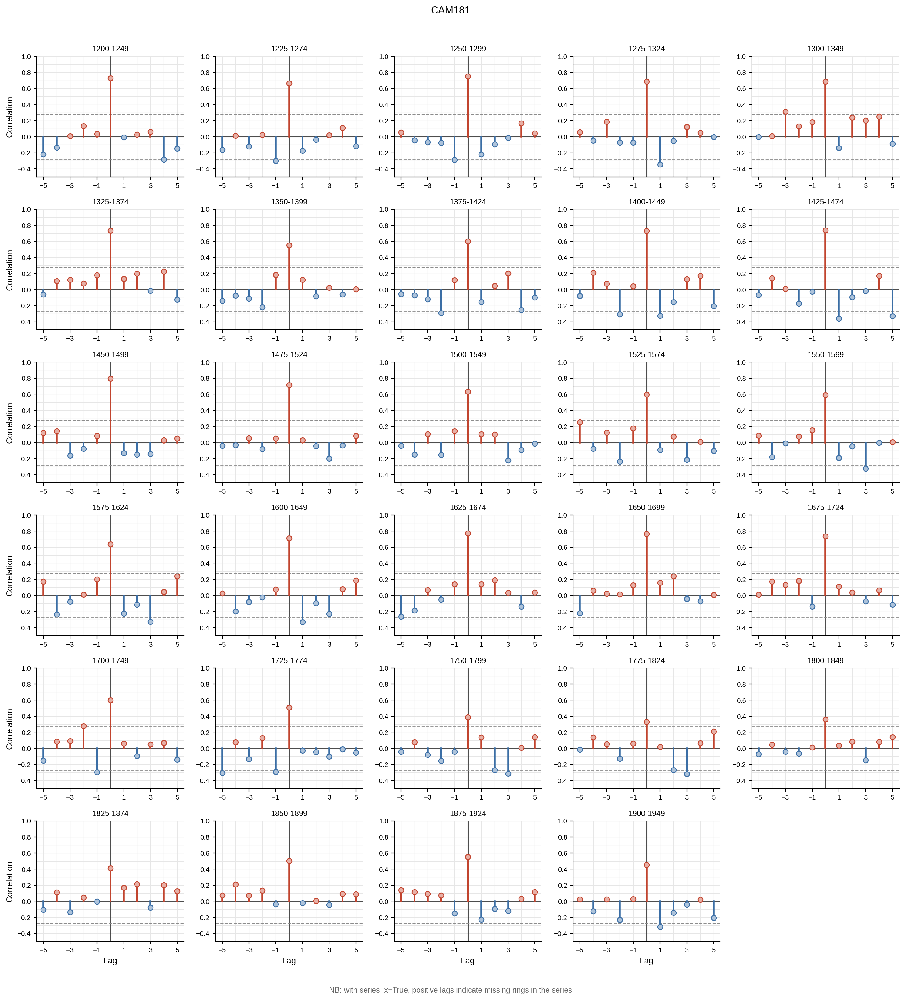

{'moving_corr': 1219    0.803890
 1220    0.797263
 1221    0.780552
 1222    0.762785
 1223    0.749532
           ...   
 1942    0.528067
 1943    0.522017
 1944    0.511261
 1945    0.499544
 1946    0.523265
 Length: 728, dtype: float64,
 'seg_corr': 630-679           NaN
 655-704           NaN
 680-729           NaN
 705-754           NaN
 730-779           NaN
 755-804           NaN
 780-829           NaN
 805-854           NaN
 830-879           NaN
 855-904           NaN
 880-929           NaN
 905-954           NaN
 930-979           NaN
 955-1004          NaN
 980-1029          NaN
 1005-1054         NaN
 1030-1079         NaN
 1055-1104         NaN
 1080-1129         NaN
 1105-1154         NaN
 1130-1179         NaN
 1155-1204         NaN
 1180-1229         NaN
 1205-1254    0.683457
 1230-1279    0.636303
 1255-1304    0.742329
 1280-1329    0.621321
 1305-1354    0.628331
 1330-1379    0.646291
 1355-1404    0.480720
 1380-1429    0.529892
 1405-1454    0.691236
 1430-147

In [18]:
dpl.series_corr(ca533_rwi, "CAM181", prewhiten=True, corr="Spearman", seg_length=50, bin_floor=10, p_val=0.05)